<a href="https://colab.research.google.com/github/carolina-garay/AnalisisYCuracion_Grupo32/blob/carolina_Garay_AyC/Garay_ayc_entregable_parte1_v4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones**

**Exploración y Curación de Datos**

*Edición 2022*

----

# Trabajo práctico entregable - parte 1
Garay Carolina

En esta notebook, vamos a cargar el conjunto de datos de [la compentencia Kaggle](https://www.kaggle.com/dansbecker/melbourne-housing-snapshot) sobre estimación de precios de ventas de propiedades en Melbourne, Australia.

Utilizaremos el conjunto de datos reducido producido por [DanB](https://www.kaggle.com/dansbecker). Hemos subido una copia a un servidor de la Universidad Nacional de Córdoba para facilitar su acceso remoto.

In [2]:
# Setup
!pip install pandas_profiling==2.8.0
!pip install pandas==1.2.0


     |████████████████████████████████| 259 kB 9.7 MB/s 
     |████████████████████████████████| 4.7 MB 32.0 MB/s 
     |████████████████████████████████| 690 kB 26.9 MB/s 
     |████████████████████████████████| 59 kB 5.1 MB/s 
     |████████████████████████████████| 812 kB 38.9 MB/s 
     |████████████████████████████████| 38.1 MB 1.9 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=6f1286c75ce172634773dbc4a9924f726317f0075f5aa2dfd72464f0c3e0185c
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295206 sha256=48d032a6b6545358214c92b4db20c97e73e1fbd89fdafc0bc3e3e10bbad5a68d
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstallin

In [3]:
!pip install python-decouple

In [4]:
import io
import matplotlib.pyplot as plt
import gdown

import seaborn as sns
sns.set_context('talk')

from decouple import config
from sqlalchemy import create_engine, text

import plotly
plotly.__version__
# Make sure it's 4.14.3

'5.5.0'

## Ejercicio 1 SQL: 

1. Crear una base de datos en SQLite utilizando la libreria [SQLalchemy](https://stackoverflow.com/questions/2268050/execute-sql-from-file-in-sqlalchemy).
https://docs.sqlalchemy.org/en/14/core/engines.html#sqlite

2. Ingestar los datos provistos en 'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv' en una tabla y el dataset generado en clase con datos de airbnb y sus precios por codigo postal en otra.

3. Implementar consultas en SQL que respondan con la siguiente información:

    - cantidad de registros totales por ciudad.
    - cantidad de registros totales por barrio y ciudad.

4. Combinar los datasets de ambas tablas ingestadas utilizando el comando JOIN de SQL  para obtener un resultado similar a lo realizado con Pandas en clase.  



##EJERCICIO1_Respuestas

1.1 Crear una base de datos en SQLite utilizando la libreria [SQLalchemy](https://stackoverflow.com/questions/2268050/execute-sql-from-file-in-sqlalchemy).
https://docs.sqlalchemy.org/en/14/core/engines.html#sqlite


In [5]:
#Luego de realizar una rápida exploración de los datos
#establecemos conexión a la base de dstos
#Aquí el módulo sqlite3 proporciona una interfaz sencilla para interactuar con bases de datos SQLite.
engine = create_engine('sqlite:///sysarmy.sqlite3', echo=True)

1.2 Ingestar los datos provistos en 'https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv' en una tabla y el dataset generado en clase con datos de airbnb y sus precios por codigo postal en otra.


In [6]:
import numpy as np
import pandas as pd

In [7]:
melb_df = pd.read_csv('https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/melb_data.csv')

In [8]:
melb_df.to_sql('melb_sql', con=engine, if_exists="replace")

2022-05-22 18:38:27,485 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("melb_sql")
2022-05-22 18:38:27,487 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 18:38:27,489 INFO sqlalchemy.engine.Engine PRAGMA temp.table_info("melb_sql")
2022-05-22 18:38:27,493 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 18:38:27,501 INFO sqlalchemy.engine.Engine BEGIN (implicit)
2022-05-22 18:38:27,506 INFO sqlalchemy.engine.Engine 
CREATE TABLE melb_sql (
	"index" BIGINT, 
	"Suburb" TEXT, 
	"Address" TEXT, 
	"Rooms" BIGINT, 
	"Type" TEXT, 
	"Price" FLOAT, 
	"Method" TEXT, 
	"SellerG" TEXT, 
	"Date" TEXT, 
	"Distance" FLOAT, 
	"Postcode" FLOAT, 
	"Bedroom2" FLOAT, 
	"Bathroom" FLOAT, 
	"Car" FLOAT, 
	"Landsize" FLOAT, 
	"BuildingArea" FLOAT, 
	"YearBuilt" FLOAT, 
	"CouncilArea" TEXT, 
	"Lattitude" FLOAT, 
	"Longtitude" FLOAT, 
	"Regionname" TEXT, 
	"Propertycount" FLOAT
)


2022-05-22 18:38:27,508 INFO sqlalchemy.engine.Engine [no key 0.00232s] ()
2022-05-22 18:38:27,530 INFO sqlalche

In [9]:
#Lectura del dataset airbnb
#Descargamos el archivo generado en clase desde drive de Carolina 
!gdown https://drive.google.com/file/d/1sUR2Odse85vmQn62yYaEsaUCRJo28Nj2/view?usp=sharing --fuzzy

airbnb_df = pd.read_csv('/content/airbnb_price_by_zipcode.csv')


Downloading...
From: https://drive.google.com/uc?id=1sUR2Odse85vmQn62yYaEsaUCRJo28Nj2
To: /content/airbnb_price_by_zipcode.csv
100% 10.1k/10.1k [00:00<00:00, 9.88MB/s]


In [10]:
airbnb_df.to_sql('airbnb_sql', con=engine, if_exists="replace")

2022-05-22 18:38:29,700 INFO sqlalchemy.engine.Engine PRAGMA main.table_info("airbnb_sql")
2022-05-22 18:38:29,709 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 18:38:29,720 INFO sqlalchemy.engine.Engine PRAGMA temp.table_info("airbnb_sql")
2022-05-22 18:38:29,727 INFO sqlalchemy.engine.Engine [raw sql] ()
2022-05-22 18:38:29,737 INFO sqlalchemy.engine.Engine BEGIN (implicit)
2022-05-22 18:38:29,745 INFO sqlalchemy.engine.Engine 
CREATE TABLE airbnb_sql (
	"index" BIGINT, 
	zipcode FLOAT, 
	airbnb_price_mean FLOAT, 
	airbnb_record_count BIGINT, 
	airbnb_weekly_price_mean FLOAT, 
	airbnb_monthly_price_mean FLOAT
)


2022-05-22 18:38:29,752 INFO sqlalchemy.engine.Engine [no key 0.00673s] ()
2022-05-22 18:38:29,773 INFO sqlalchemy.engine.Engine CREATE INDEX ix_airbnb_sql_index ON airbnb_sql ("index")
2022-05-22 18:38:29,788 INFO sqlalchemy.engine.Engine [no key 0.01508s] ()
2022-05-22 18:38:29,803 INFO sqlalchemy.engine.Engine COMMIT
2022-05-22 18:38:29,810 INFO sqlalchemy.engine.

In [11]:
#Visualización de columnas de los dataframe airbnb_df y melb_df
print("Columnas de airbnb_df:",airbnb_df.columns)
print("Columnas de melb_df:",melb_df.columns)


Columnas de airbnb_df: Index(['zipcode', 'airbnb_price_mean', 'airbnb_record_count',
       'airbnb_weekly_price_mean', 'airbnb_monthly_price_mean'],
      dtype='object')
Columnas de melb_df: Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')


In [12]:
 #Recuento de filas de los dataframe
 print(len(airbnb_df))
 print(len(melb_df))

247
13580


3. Implementar consultas en SQL que respondan con la siguiente información:

    - cantidad de registros totales por ciudad.
    - cantidad de registros totales por barrio y ciudad.

In [13]:

# Cantidad de registros totales por ciudad en el dataframe melb_df
query1 = "SELECT CouncilArea, COUNT(CouncilArea) FROM melb_sql GROUP BY CouncilArea"

# Cantidad de registros totales por barrio y ciudad en el dataframe melb_df
query2 = "SELECT CouncilArea, Suburb, COUNT(Suburb) FROM melb_sql GROUP BY Suburb ORDER BY CouncilArea"



In [14]:
#Lista con las consultas 
queries = [query1, query2]


In [ ]:
with engine.connect() as con:
    for query in queries:
      rs = con.execute(query)
      print(query)
      for row in rs:
          print(row)

      print('\n\n')

1.4 Combinar los datasets de ambas tablas ingestadas utilizando el comando JOIN de SQL  para obtener un resultado similar a lo realizado con Pandas en clase.  



In [16]:
airbn_melb_df= engine.connect().execute('SELECT * FROM  melb_sql LEFT JOIN airbnb_sql ON melb_sql.Postcode = airbnb_sql.zipcode')

2022-05-22 18:38:30,183 INFO sqlalchemy.engine.Engine SELECT * FROM  melb_sql LEFT JOIN airbnb_sql ON melb_sql.Postcode = airbnb_sql.zipcode
2022-05-22 18:38:30,191 INFO sqlalchemy.engine.Engine [raw sql] ()


## Ejercicio 2: 

1. Seleccionar un subconjunto de columnas que les parezcan relevantes al problema de predicción del valor de la propiedad. Justificar las columnas seleccionadas y las que no lo fueron.
 - Eliminar los valores extremos que no sean relevantes para la predicción de valores de las propiedades.

2. Agregar información adicional respectiva al entorno de una propiedad a partir del [conjunto de datos de AirBnB](https://www.kaggle.com/tylerx/melbourne-airbnb-open-data?select=cleansed_listings_dec18.csv) utilizado en el práctico. 
  1. Seleccionar qué variables agregar y qué combinaciones aplicar a cada una. Por ejemplo, pueden utilizar solo la columna `price`, o aplicar múltiples transformaciones como la mediana o el mínimo.
  1. Utilizar la variable zipcode para unir los conjuntos de datos. Sólo incluir los zipcodes que tengan una cantidad mínima de registros (a elección) como para que la información agregada sea relevante.
  2. Investigar al menos otras 2 variables que puedan servir para combinar los datos, y justificar si serían adecuadas o no. Pueden asumir que cuentan con la ayuda de anotadores expertos para encontrar equivalencias entre barrios o direcciones, o que cuentan con algoritmos para encontrar las n ubicaciones más cercanas a una propiedad a partir de sus coordenadas geográficas. **NO** es necesario que realicen la implementación.

Pueden leer otras columnas del conjunto de AirBnB además de las que están en `interesting_cols`, si les parecen relevantes.

##EJERCICIO2_Respuestas

1. Seleccionar un subconjunto de columnas que les parezcan relevantes al problema de predicción del valor de la propiedad. Justificar las columnas seleccionadas y las que no lo fueron.
 - Eliminar los valores extremos que no sean relevantes para la predicción de valores de las propiedades.

In [17]:
from pandas_profiling import ProfileReport

In [20]:
profile = ProfileReport(melb_df)
profile

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Basados en el reporte de pandas_profiling seleccionamos las siguientes variables para estudiar el problema de predicción del valor de la propiedad.
*  YearBuilt
*  BuildingArea
*  Car
*  Price
*  Postcode
*  Rooms


In [21]:
melb_new= melb_df[['YearBuilt','BuildingArea' ,'Car','Price' ,'Postcode','Rooms']]
melb_new.head()

,YearBuilt,BuildingArea,Car,Price,Postcode,Rooms
0,NaN,NaN,1.0,1480000.0,3067.0,2
1,1900.0,79.0,0.0,1035000.0,3067.0,2
2,1900.0,150.0,0.0,1465000.0,3067.0,3
3,NaN,NaN,1.0,850000.0,3067.0,3
4,2014.0,142.0,2.0,1600000.0,3067.0,4


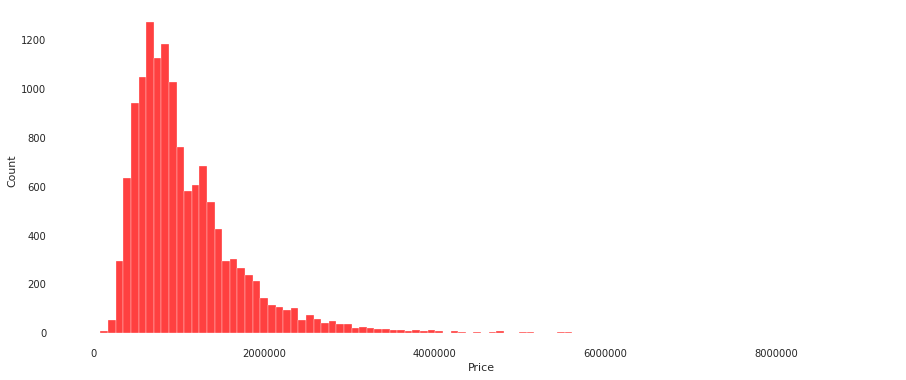

In [27]:
#Histograma de la base de datos melb_new
plt.figure(figsize=(15,6))
sns.histplot(melb_new.Price.dropna(), bins=100, color ='red')
plt.ticklabel_format(style='plain')
sns.despine()

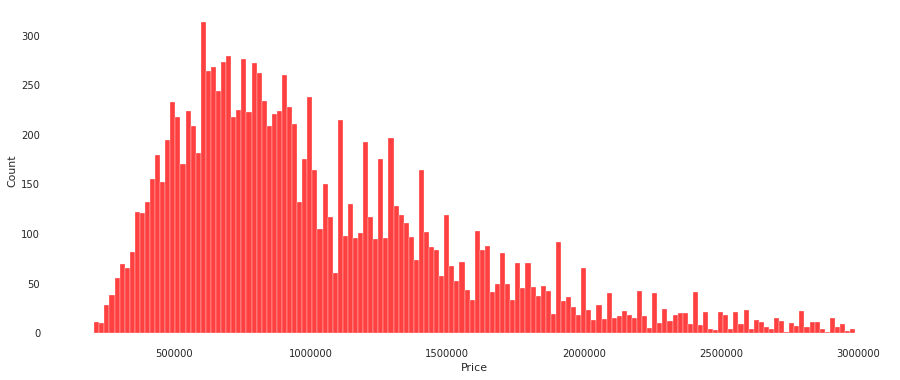

In [23]:
# Filtrado de la base de datos por precios 

melb_newp =  melb_new[(melb_new['Price'] > 200000) & (melb_new['Price'] < 3000000)]
plt.figure(figsize=(15,6))
sns.histplot(melb_newp['Price'].dropna(), bins=150, color ='red')
plt.ticklabel_format(style='plain')
sns.despine()

In [25]:
#Filtrado de la base de datos por valores extremos Car
melb_newc =  melb_newp [melb_newp ['Car'] < 7]

#Filtrado de la base de datos por valores extremos YearBuilt
melb_newy  =  melb_newc[melb_newc['YearBuilt'] > 1989]

In [37]:
melb_newc.head()

,YearBuilt,BuildingArea,Car,Price,Postcode,Rooms
0,NaN,NaN,1.0,1480000.0,3067.0,2
1,1900.0,79.0,0.0,1035000.0,3067.0,2
2,1900.0,150.0,0.0,1465000.0,3067.0,3
3,NaN,NaN,1.0,850000.0,3067.0,3
4,2014.0,142.0,2.0,1600000.0,3067.0,4


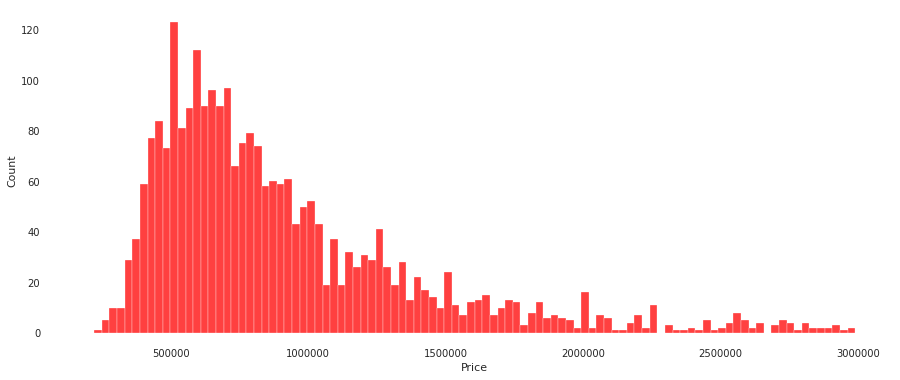

In [26]:
plt.figure(figsize=(15,6))
sns.histplot(melb_newy.Price, bins=100, color ='red')
plt.ticklabel_format(style='plain')
sns.despine()


2. Agregar información adicional respectiva al entorno de una propiedad a partir del [conjunto de datos de AirBnB](https://www.kaggle.com/tylerx/melbourne-airbnb-open-data?select=cleansed_listings_dec18.csv) utilizado en el práctico. 
  1. Seleccionar qué variables agregar y qué combinaciones aplicar a cada una. Por ejemplo, pueden utilizar solo la columna `price`, o aplicar múltiples transformaciones como la mediana o el mínimo.

In [28]:
# Seleccionamos las variables a agregar
interesting_features = ['zipcode','price', 'weekly_price', 'monthly_price']
AirB = pd.read_csv('https://cs.famaf.unc.edu.ar/~mteruel/datasets/diplodatos/cleansed_listings_dec18.csv', usecols=interesting_features)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (35) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [29]:
# Filtramos las columnas correspondientes a las variables seleccionadas y luego realizamos la agregación agrupando por zipcode.
# La operación conlleva pasar como argumento el nombre de la nueva columna y como valor una tupla donde el primer valor es el nombre de la
# columna original y el segundo valor es la operación de agregación que nos interesa.
AirB_agg = AirB[interesting_features].groupby('zipcode').agg(AirB_record_count=('price', 'count'),
        AirB_daily_price_mean=('price', 'mean'),
        AirB_weekly_price_mean=('weekly_price', 'mean'),
        AirB_monthly_price_mean=('monthly_price', 'mean'))\
        .reset_index()

In [30]:
AirB_agg.head()

,zipcode,AirB_record_count,AirB_daily_price_mean,AirB_weekly_price_mean,AirB_monthly_price_mean
0,2010.0,1,40.00000,NaN,NaN
1,2134.0,1,50.00000,NaN,NaN
2,2582.0,1,104.00000,NaN,NaN
3,3000.0,2491,149.23605,804.0,3469.0
4,3001.0,1,120.00000,NaN,NaN


1. Utilizar la variable zipcode para unir los conjuntos de datos. Sólo incluir los zipcodes que tengan una cantidad mínima de registros (a elección) como para que la información agregada sea relevante.

In [31]:
# Seleccionamos los zipcodes que tienen al menos 3 registros en un compromiso entre contar con suficientes datos sin perder demasiados zipcodes 
AirB_aggClean = AirB_agg[AirB_agg['AirB_record_count']>2]
print(len(AirB_agg))
print(len(AirB_aggClean))

463
396


In [32]:
# Convertimos zipcode de object a float64 para que coincidan los dtypes al realizar el merge
AirB_aggClean['zipcode'] = AirB_aggClean['zipcode'].astype(float, errors = 'raise')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [34]:
# Unimos los datasets
Merge_df = melb_newc.merge(AirB_aggClean, how='left', left_on='Postcode', right_on='zipcode')
Merge_df.sample(5)

,YearBuilt,BuildingArea,Car,Price,Postcode,Rooms,zipcode,AirB_record_count,AirB_daily_price_mean,AirB_weekly_price_mean,AirB_monthly_price_mean
13346,NaN,NaN,2.0,771000.0,3060.0,4,3060.0,9.0,49.666667,NaN,NaN
4442,1970.0,37.0,1.0,347000.0,3184.0,1,3184.0,181.0,156.563536,1112.226415,3628.139535
3635,NaN,NaN,1.0,955000.0,3058.0,4,3058.0,84.0,93.678571,NaN,NaN
15304,NaN,NaN,1.0,435000.0,3123.0,2,3123.0,45.0,145.577778,NaN,NaN
1559,NaN,NaN,2.0,716000.0,3165.0,2,3165.0,35.0,106.228571,NaN,NaN


## Ejercicio 3:

Crear y guardar un nuevo conjunto de datos con todas las transformaciones realizadas anteriormente.

In [36]:
from google.colab import files

Merge_df.to_csv('Merge_df.csv', index=None)
files.download('Merge_df.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Ejercicios opcionales:

1. Armar un script en python (archivo .py) [ETL](https://towardsdatascience.com/what-to-log-from-python-etl-pipelines-9e0cfe29950e) que corra los pasos de extraccion, transformacion y carga, armando una funcion para cada etapa del proceso y luego un main que corra todos los pasos requeridos.

2. Armar un DAG en Apache Airflow que corra el ETL. (https://airflow.apache.org/docs/apache-airflow/stable/tutorial.html)